<a href="https://colab.research.google.com/github/seansothey/MyProject/blob/master/opencv_super_resolution_DeepLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# OpenCV Super Resolution with Deep Learning


### Install the necessary packages

In [1]:
!pip install opencv-contrib-python==4.4.0.44

     |████████████████████████████████| 55.7MB 59kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


### Download the code zip file

In [2]:
!wget https://pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com/opencv-super-resolution/opencv-super-resolution.zip
!unzip -qq opencv-super-resolution.zip
%cd opencv-super-resolution

--2020-11-11 05:29:48--  https://pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com/opencv-super-resolution/opencv-super-resolution.zip
Resolving pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com (pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com)... 52.218.242.137
Connecting to pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com (pyimagesearch-code-downloads.s3-us-west-2.amazonaws.com)|52.218.242.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 36015388 (34M) [application/zip]
Saving to: ‘opencv-super-resolution.zip’

opencv-super-resolu 100%[===================>]  34.35M  11.7MB/s    in 2.9s    

2020-11-11 05:29:51 (11.7 MB/s) - ‘opencv-super-resolution.zip’ saved [36015388/36015388]

/content/opencv-super-resolution


## Blog Post Code

### Import Packages

In [3]:
# import the necessary packages
import matplotlib.pyplot as plt
import argparse
import imutils
import time
import cv2
import os

### Function to display images in Jupyter Notebooks and Google Colab

In [4]:
def plt_imshow(title, image):
    # convert the image frame BGR to RGB color space and display it
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	plt.imshow(image)
	plt.title(title)
	plt.grid(False)
	plt.show()

### Implementing OpenCV super resolution with images

In [5]:
# construct the argument parser and parse the arguments
#ap = argparse.ArgumentParser()
#ap.add_argument("-m", "--model", required=True,
#	help="path to super resolution model")
#ap.add_argument("-i", "--image", required=True,
#	help="path to input image we want to increase resolution of")
#args = vars(ap.parse_args())

# since we are using Jupyter Notebooks we can replace our argument
# parsing code with *hard coded* arguments and values
args = {
    "model": "models/LapSRN_x8.pb",
    "image": "examples/zebra.png"
}

In [6]:
# extract the model name and model scale from the file path
modelName = args["model"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale = args["model"].split("_x")[-1]
modelScale = int(modelScale[:modelScale.find(".")])

In [7]:
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
print("[INFO] loading super resolution model: {}".format(
	args["model"]))
print("[INFO] model name: {}".format(modelName))
print("[INFO] model scale: {}".format(modelScale))
sr = cv2.dnn_superres.DnnSuperResImpl_create()
sr.readModel(args["model"])
sr.setModel(modelName, modelScale)

[INFO] loading super resolution model: models/LapSRN_x8.pb
[INFO] model name: lapsrn
[INFO] model scale: 8


In [8]:
# load the input image from disk, resize it to have a maximum width of 200
# pixels, and display its spatial dimensions
image = cv2.imread(args["image"])
image = imutils.resize(image, width=200)
print("[INFO] w: {}, h: {}".format(image.shape[1], image.shape[0]))

# use the super resolution model to upscale the image, timing how
# long it takes
start = time.time()
upscaled = sr.upsample(image)
end = time.time()
print("[INFO] super resolution took {:.6f} seconds".format(
	end - start))

# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled.shape[1],
	upscaled.shape[0]))

[INFO] w: 200, h: 133
[INFO] super resolution took 12.760060 seconds
[INFO] w: 1600, h: 1064


In [9]:
# resize the image using standard bicubic interpolation
start = time.time()
bicubic = cv2.resize(image, (upscaled.shape[1], upscaled.shape[0]),
	interpolation=cv2.INTER_CUBIC)
end = time.time()
print("[INFO] bicubic interpolation took {:.6f} seconds".format(
	end - start))

[INFO] bicubic interpolation took 0.005812 seconds


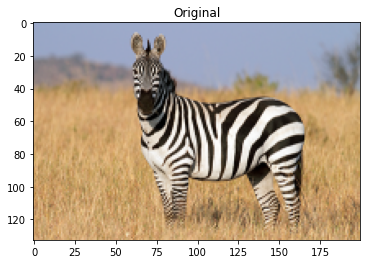

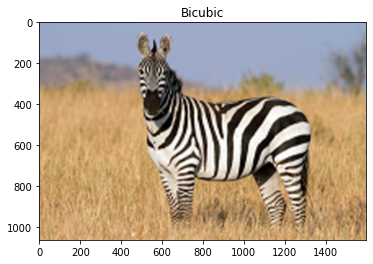

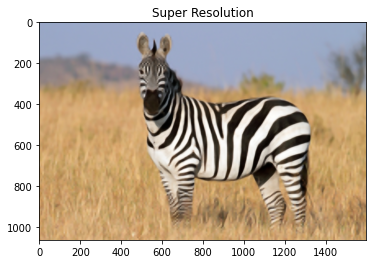

In [10]:
# show the original input image, bicubic interpolation image, and
# super resolution deep learning output
plt_imshow("Original", image)
plt_imshow("Bicubic", bicubic)
plt_imshow("Super Resolution", upscaled)

### Implementing real-time super resolution with OpenCV

In [11]:
# first, let's get a video on which we can run our Super Resolution model
!wget https://colab-notebook-videos.s3-us-west-2.amazonaws.com/opencv_face_detection.mp4

--2020-11-11 05:30:06--  https://colab-notebook-videos.s3-us-west-2.amazonaws.com/opencv_face_detection.mp4
Resolving colab-notebook-videos.s3-us-west-2.amazonaws.com (colab-notebook-videos.s3-us-west-2.amazonaws.com)... 52.218.216.185
Connecting to colab-notebook-videos.s3-us-west-2.amazonaws.com (colab-notebook-videos.s3-us-west-2.amazonaws.com)|52.218.216.185|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 36191613 (35M) [video/mp4]
Saving to: ‘opencv_face_detection.mp4’

opencv_face_detecti 100%[===================>]  34.51M  11.5MB/s    in 3.0s    

2020-11-11 05:30:10 (11.5 MB/s) - ‘opencv_face_detection.mp4’ saved [36191613/36191613]



In [12]:
# construct the argument parser and parse the arguments
#ap = argparse.ArgumentParser()
#ap.add_argument("-m", "--model", required=True,
#	help="path to super resolution model")
#args = vars(ap.parse_args())

# since we are using Jupyter Notebooks we can replace our argument
# parsing code with *hard coded* arguments and values
args = {
    "model": "models/ESPCN_x4.pb",
    "input": "opencv_face_detection.mp4",
    "output_original": "output_original.avi",
    "output_bicubic": "output_bicubic.avi",
    "output_sr": "output_sr.avi",
}

In [13]:
# extract the model name and model scale from the file path
modelName = args["model"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale = args["model"].split("_x")[-1]
modelScale = int(modelScale[:modelScale.find(".")])

# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
print("[INFO] loading super resolution model: {}".format(
	args["model"]))
print("[INFO] model name: {}".format(modelName))
print("[INFO] model scale: {}".format(modelScale))
sr = cv2.dnn_superres.DnnSuperResImpl_create()
sr.readModel(args["model"])
sr.setModel(modelName, modelScale)

# grab a reference to the video file, initialize a flag to initialize the video
# writer pointers, and initialize pointers to output video files
print("[INFO] opening video file...")
vs = cv2.VideoCapture(args["input"])
initWriters = True
writer = {"original": None, "bicubic": None, "sr": None}

[INFO] loading super resolution model: models/ESPCN_x4.pb
[INFO] model name: espcn
[INFO] model scale: 4
[INFO] opening video file...


In [14]:
# loop over the frames from the video stream
while True:
	# grab the next frame
	frame = vs.read()[1]

	# if we did not grab a frame then we have reached the end of the
	# video
	if frame is None:
		break

	# resize the frame to have a maximum width of 200 pixels
	frame = imutils.resize(frame, width=200)

	# upscale the frame using the super resolution model and then
	# bicubic interpolation (so we can visually compare the two)
	upscaled = sr.upsample(frame)
	bicubic = cv2.resize(frame,
		(upscaled.shape[1], upscaled.shape[0]),
		interpolation=cv2.INTER_CUBIC)

	# check if we have to initialize the video writer objects
	if initWriters:
		# intialize all three video writer objects
		fourcc = cv2.VideoWriter_fourcc(*"MJPG")
		writer["original"] = cv2.VideoWriter(args["output_original"], fourcc,
			20,(frame.shape[1], frame.shape[0]), True)
		writer["bicubic"] = cv2.VideoWriter(args["output_bicubic"], fourcc, 20,
			(bicubic.shape[1], bicubic.shape[0]), True)
		writer["sr"] = cv2.VideoWriter(args["output_sr"], fourcc, 20,
			(upscaled.shape[1], upscaled.shape[0]), True)
		
		# set the initialization flag as False
		initWriters = False

	# if we have set the video writer objects, write the frames to disk
	if not initWriters:
		writer["original"].write(frame)
		writer["bicubic"].write(bicubic)
		writer["sr"].write(upscaled)

In [15]:
# do a bit of cleanup
vs.release()

# check to see if the video writer points need to be released
if not initWriters:
	writer["original"].release()
	writer["bicubic"].release()
	writer["sr"].release()

Note that the above code block may take time to execute. If you are interested to view the video within Colab just execute the following code blocks. Note that it may be time-consuming.

Our output videos are produced in `.avi` format. First, we need to convert them to `.mp4` format.

In [16]:
!ffmpeg -i output_original.avi output_original.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [17]:
!ffmpeg -i output_bicubic.avi output_bicubic.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [18]:
!ffmpeg -i output_sr.avi output_sr.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [19]:
#@title Display original video inline
from IPython.display import HTML
from base64 import b64encode

mp4 = open("output_original.mp4", "rb").read()
dataURL = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % dataURL)

In [20]:
#@title Display bicubic video inline
from IPython.display import HTML
from base64 import b64encode

mp4 = open("output_bicubic.mp4", "rb").read()
dataURL = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % dataURL)

In [21]:
#@title Display super resolution video inline
from IPython.display import HTML
from base64 import b64encode

mp4 = open("output_sr.mp4", "rb").read()
dataURL = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % dataURL)